In [1]:
from skimage import data, color, exposure
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from scipy.signal import convolve2d
from skimage.filters import gaussian, median
from scipy.ndimage import minimum_filter, maximum_filter
from skimage.util import random_noise

(<AxesSubplot:>,
 (-0.5, 397.5, 403.5, -0.5))

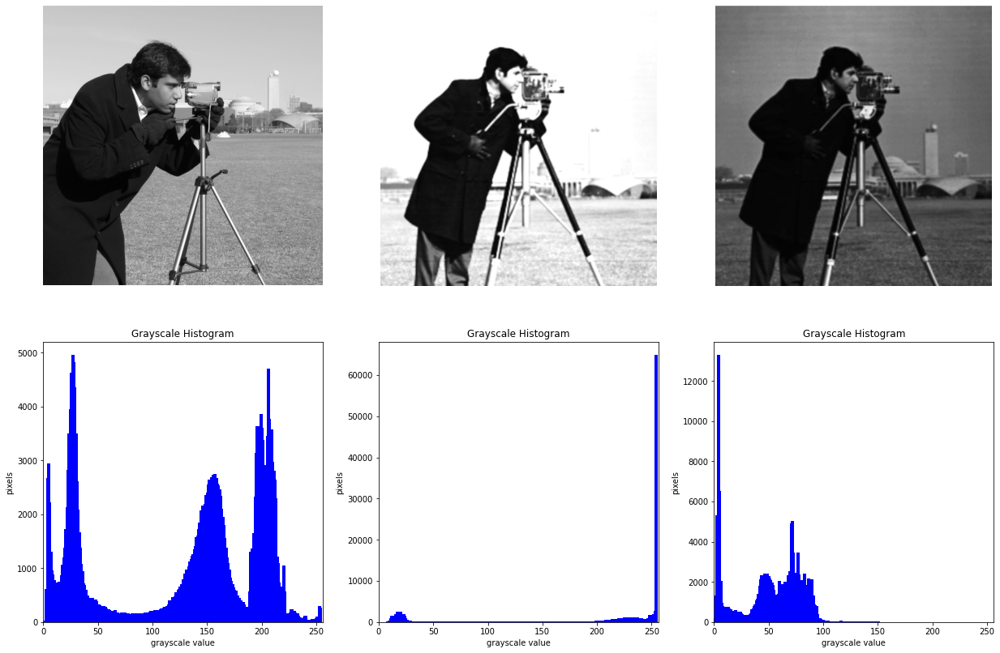

In [2]:
# Exercise 1.1

# Camera

im = data.camera()

histogram, bin_edges = np.histogram(im, bins=256, range=(0, 255), density=False)

plt.figure(figsize=(21, 14))
plt.subplot(234), plt.bar(bin_edges[:-1], histogram, width=3, color='blue'), plt.axis('on'),
plt.title("Grayscale Histogram"), plt.xlabel("grayscale value"), plt.ylabel("pixels"), plt.xlim([0.0, 256.0]),
plt.subplot(231), plt.imshow(im, cmap='gray'), plt.axis('off')

# CameraBright.jpg

im = imread("CameraBright.jpg")
im = color.rgb2gray(im) * 255

histogram, bin_edges = np.histogram(im, bins=256, range=(0, 255), density=False)

plt.subplot(235), plt.bar(bin_edges[:-1], histogram, width=3, color='blue'), plt.axis('on'),
plt.title("Grayscale Histogram"), plt.xlabel("grayscale value"), plt.ylabel("pixels"), plt.xlim([0.0, 256.0]),
plt.subplot(232), plt.imshow(im, cmap='gray'), plt.axis('off')

# CameraDark.jpg

im = imread("CameraDark.jpg")
im = color.rgb2gray(im) * 255

histogram, bin_edges = np.histogram(im, bins=256, range=(0, 255), density=False)

plt.subplot(236), plt.bar(bin_edges[:-1], histogram, width=3, color='blue'), plt.axis('on'),
plt.title("Grayscale Histogram"), plt.xlabel("grayscale value"), plt.ylabel("pixels"), plt.xlim([0.0, 256.0]),
plt.subplot(233), plt.imshow(im, cmap='gray'), plt.axis('off')

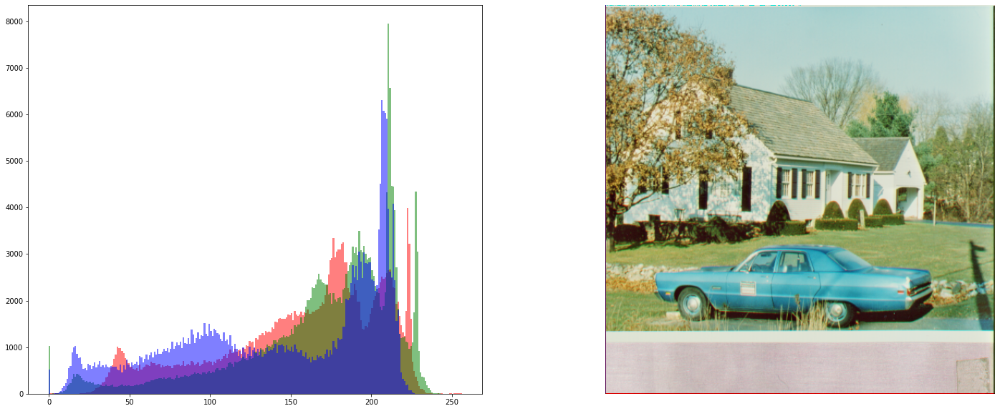

In [3]:
# Exercise 1.2

im = imread("house.tiff")

# import cv2
# import pylab

# imRed, imGreen, imBlue = cv2.split(im)

# pylab.hist(np.array(imRed).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
# pylab.hist(np.array(imGreen).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
# pylab.hist(np.array(imBlue).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)

# # https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_core/py_basic_ops/py_basic_ops.html#splitting-and-merging-image-channels
# # cv2.split() is a costly operation (in terms of time), so only use it if necessary.
# # Numpy indexing is much more efficient and should be used if possible.



plt.figure(figsize=(25, 10))
plt.subplot(121)
plt.hist(im[:, :, 0].ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(im[:, :, 1].ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(im[:, :, 2].ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.subplot(122)
plt.imshow(im), plt.axis('off')
plt.show()

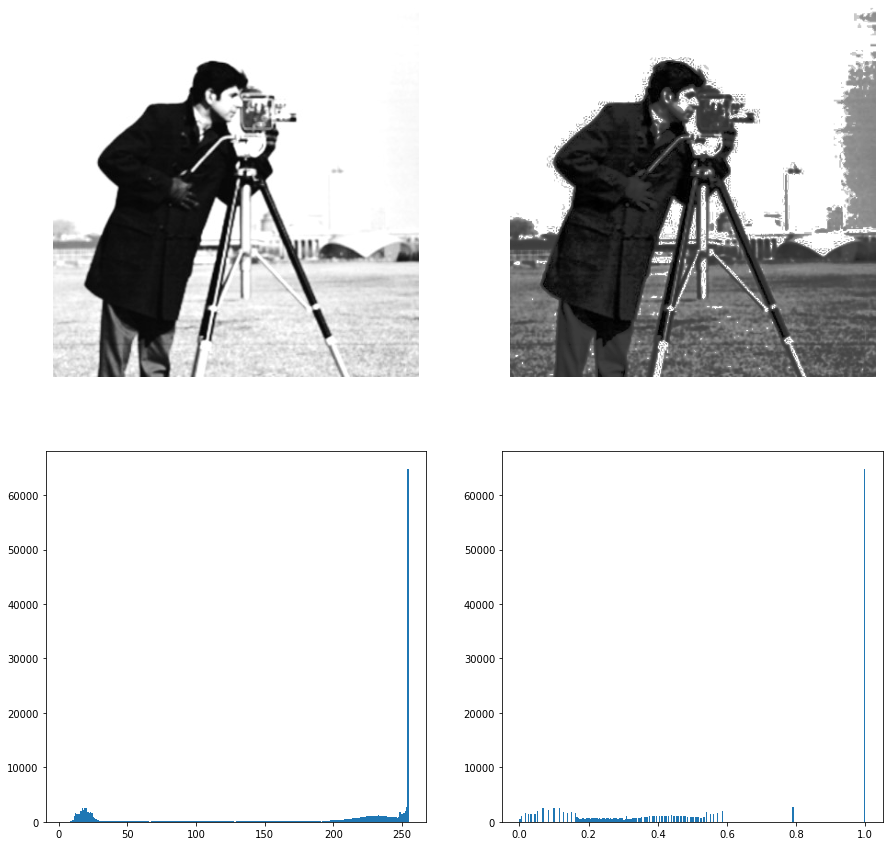

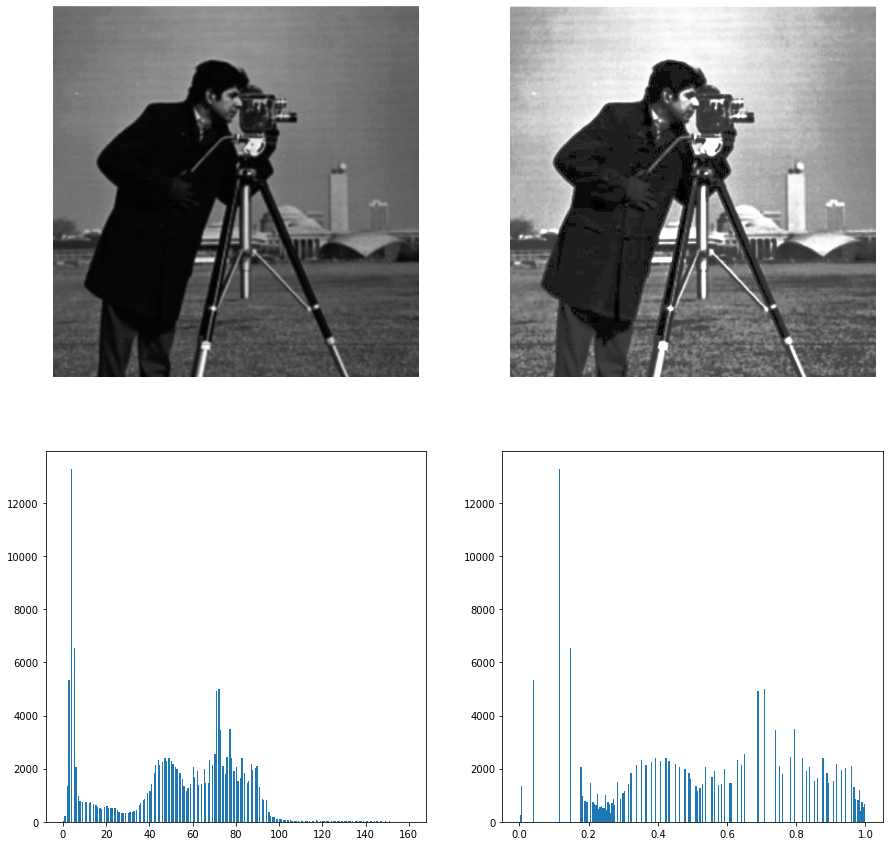

In [4]:
# Exercise 2

im = imread("CameraBright.jpg")
im = color.rgb2gray(im) * 255

im_eq = exposure.equalize_hist(im)

plt.figure(figsize=(15, 15))
plt.subplot(221), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(222), plt.imshow(im_eq, cmap='gray'), plt.axis('off')
plt.subplot(223), plt.hist(im.ravel(), bins=256)
plt.subplot(224), plt.hist(im_eq.ravel(), bins=256)
plt.show()



im = imread("CameraDark.jpg")
im = color.rgb2gray(im) * 255

im_eq = exposure.equalize_hist(im)

plt.figure(figsize=(15, 15))
plt.subplot(221), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(222), plt.imshow(im_eq, cmap='gray'), plt.axis('off')
plt.subplot(223), plt.hist(im.ravel(), bins=256)
plt.subplot(224), plt.hist(im_eq.ravel(), bins=256)
plt.show()

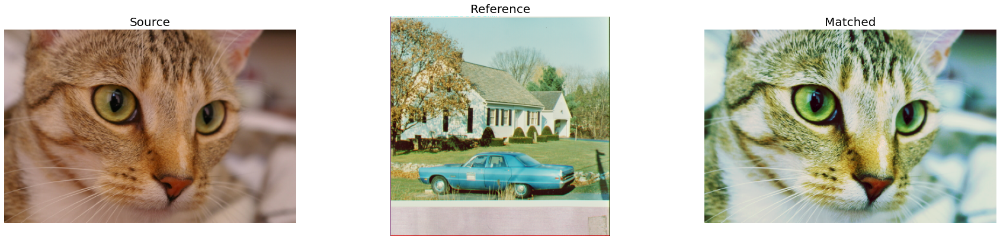

In [5]:
# Exercise 3

image = data.chelsea()
reference = imread("house.tiff")

matched = exposure.match_histograms(image, reference, multichannel=True)

plt.figure(figsize=(30, 15))
plt.subplot2grid((2, 3), (0, 0)), plt.imshow(image), plt.axis('off'), plt.title('Source', size=20)
plt.subplot2grid((2, 3), (0, 1)), plt.imshow(reference), plt.axis('off'), plt.title('Reference', size=20)
plt.subplot2grid((2, 3), (0, 2)), plt.imshow(matched), plt.axis('off'), plt.title('Matched', size=20)
plt.show()

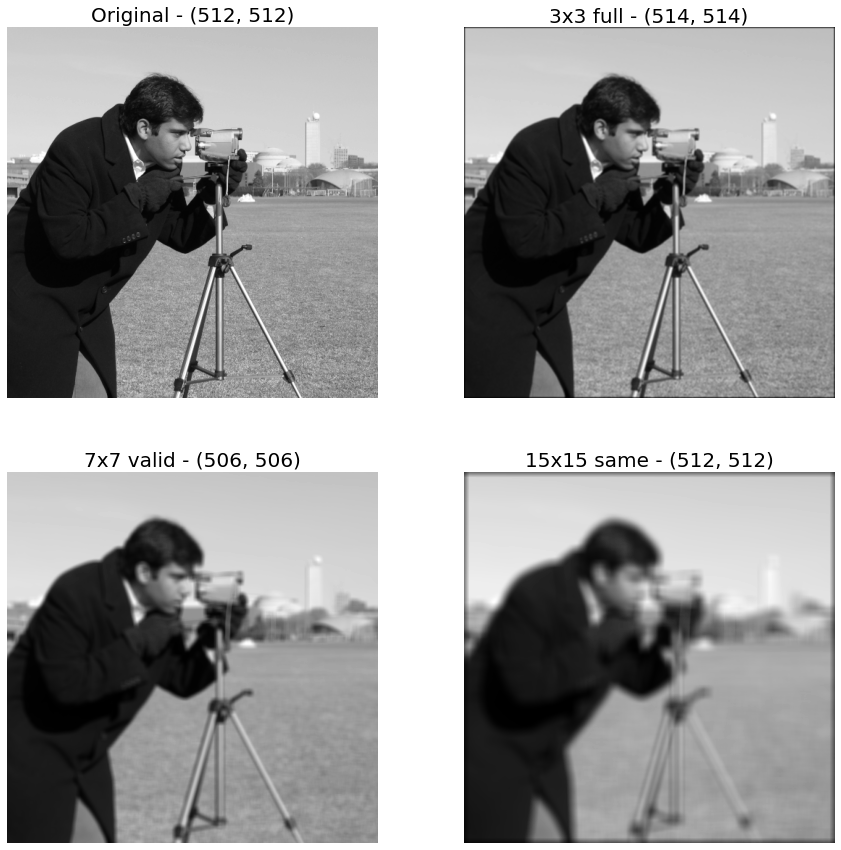

In [6]:
# Exercise 4

im = data.camera()

kernel = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9]
])
im3x3 = convolve2d(im, kernel, mode='full')

kernel = np.full(shape=(7, 7), fill_value=1/49)
im7x7 = convolve2d(im, kernel, mode='valid')

kernel = np.full(shape=(15, 15), fill_value=1/225)
im15x15 = convolve2d(im, kernel, mode='same')

plt.figure(figsize=(15, 15))
plt.subplot(221), plt.imshow(im, cmap='gray'), plt.axis('off'), plt.title('Original - (512, 512)', size=20)
plt.subplot(222), plt.imshow(im3x3, cmap='gray'), plt.axis('off'), plt.title('3x3 full - (514, 514)', size=20)
plt.subplot(223), plt.imshow(im7x7, cmap='gray'), plt.axis('off'), plt.title('7x7 valid - (506, 506)', size=20)
plt.subplot(224), plt.imshow(im15x15, cmap='gray'), plt.axis('off'), plt.title('15x15 same - (512, 512)', size=20)
plt.show()

# print(im.shape, im3x3.shape, im7x7.shape, im15x15.shape)
# (512, 512) (514, 514) (506, 506) (512, 512)

# full
# The output is the full discrete linear convolution of the inputs. (Default)

# valid
# The output consists only of those elements that do not rely on the zero-padding. In ‘valid’ mode, either in1 or in2 must be at least as large as the other in every dimension.

# same
# The output is the same size as in1, centered with respect to the ‘full’ output.

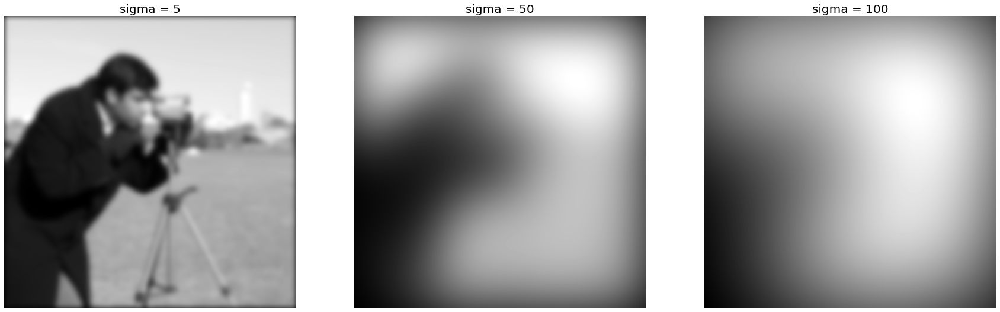

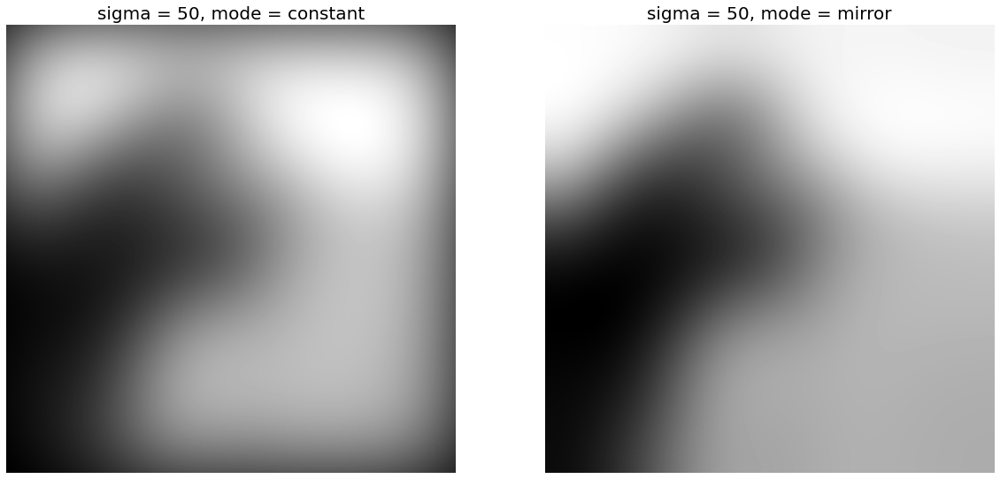

In [7]:
# Exercise 5

im = data.camera()

imGa5 = gaussian(im, sigma=5, mode='constant')
imGa50 = gaussian(im, sigma=50, mode='constant')
imGa100 = gaussian(im, sigma=100, mode='constant')

plt.figure(figsize=(30, 10))
plt.subplot(131), plt.imshow(imGa5, cmap='gray'), plt.axis('off'), plt.title('sigma = 5', size=20)
plt.subplot(132), plt.imshow(imGa50, cmap='gray'), plt.axis('off'), plt.title('sigma = 50', size=20)
plt.subplot(133), plt.imshow(imGa100, cmap='gray'), plt.axis('off'), plt.title('sigma = 100', size=20)
plt.show()

imGa50Mi = gaussian(im, sigma=50, mode='mirror')

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(imGa50, cmap='gray'), plt.axis('off'), plt.title('sigma = 50, mode = constant', size=20)
plt.subplot(122), plt.imshow(imGa50Mi, cmap='gray'), plt.axis('off'), plt.title('sigma = 50, mode = mirror', size=20)
plt.show()

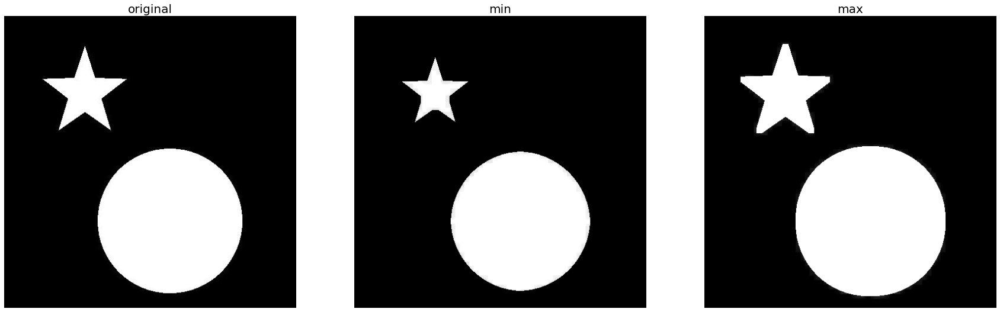

In [8]:
# Exercise 6.1

im = imread("im1GRAY.jpg")

imMin = minimum_filter(im, size=(10, 10))
imMax = maximum_filter(im, size=(10, 10))

plt.figure(figsize=(30, 10))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.axis('off'), plt.title('original', size=20)
plt.subplot(132), plt.imshow(imMin, cmap='gray'), plt.axis('off'), plt.title('min', size=20)
plt.subplot(133), plt.imshow(imMax, cmap='gray'), plt.axis('off'), plt.title('max', size=20)
plt.show()

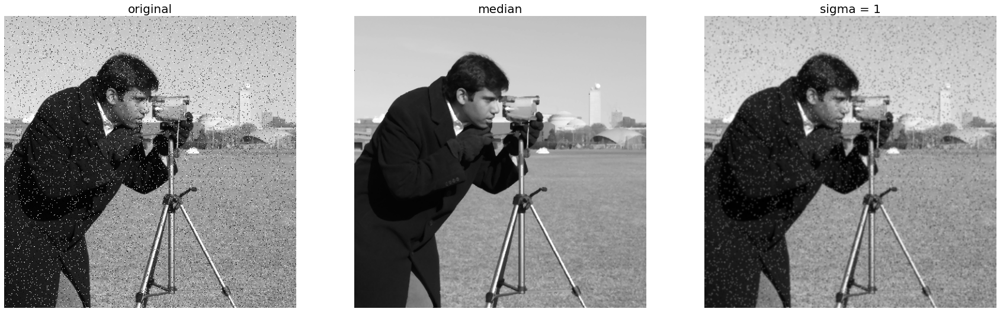

In [9]:
# Exercise 6.2

im = data.camera()
im = random_noise(im, mode='s&p')

imMe = median(im)
imGa1 = gaussian(im, sigma=1)

plt.figure(figsize=(30, 10))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.axis('off'), plt.title('original', size=20)
plt.subplot(132), plt.imshow(imMe, cmap='gray'), plt.axis('off'), plt.title('median', size=20)
plt.subplot(133), plt.imshow(imGa1, cmap='gray'), plt.axis('off'), plt.title('sigma = 1', size=20)
plt.show()